# San Diego Vehicle Pull-Over Investigation

To investigate the PD pull-over distribution over the region and the race, the first thing required to be understood is the san diego beat, police responsible areas and the service regions 

This notebook is focused on the visulization on SD geography with the following Python Packages
1. GeoPandas
2. Folium Map

## San Diego Police Beats and Service Area

In [1]:
import pandas as pd
import geopandas as gpd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
sd_pd_beats = gpd.read_file('./pd_beats_datasd.geojson')

In [3]:
sd_pd_beats.head()

,objectid,beat,div,serv,name,geometry
0,2,116,1,110,BAY PARK,"POLYGON ((-117.19942659 32.81173672, -117.1994..."
1,5,524,5,520,CORE-COLUMBIA,"POLYGON ((-117.16917574 32.71985627, -117.1682..."
2,37,811,8,810,NORMAL HEIGHTS,"POLYGON ((-117.10919302 32.76326435, -117.1091..."
3,42,322,3,320,ALLIED GARDENS,"POLYGON ((-117.06435457 32.79634794, -117.0643..."
4,44,812,8,810,BURLINGAME,"POLYGON ((-117.1252835 32.72963144, -117.12554..."


### Note
1. beat, the beat number, indicates San Diego police beat region
2. serv, the police service area, indicates San Diego service area
3. Different beats may share the same service area, and thus the number of service area will be lower than the number of beats


In [4]:
uniq = sd_pd_beats.beat.value_counts()

****With the deeper look inside the data, some geometry polygons share the same beat number. With the following code, these region name can be found out****

In [5]:
uniq = uniq[uniq>1].reset_index()
uniq.rename(index=str, columns={"index": "beat", "beat": "counts"}, inplace=True)
uniq_j = uniq.join(sd_pd_beats.set_index('beat'), on='beat', how='left')
uniq_j.name.value_counts()

TIJUANA RIVER VALLEY    7
MISSION BAY             4
SAN DIEGO               3
SKYLINE                 2
SAN PASQUAL             2
BARRIO LOGAN            1
                        1
Name: name, dtype: int64

## Visualize Beat Regions with Geopandas

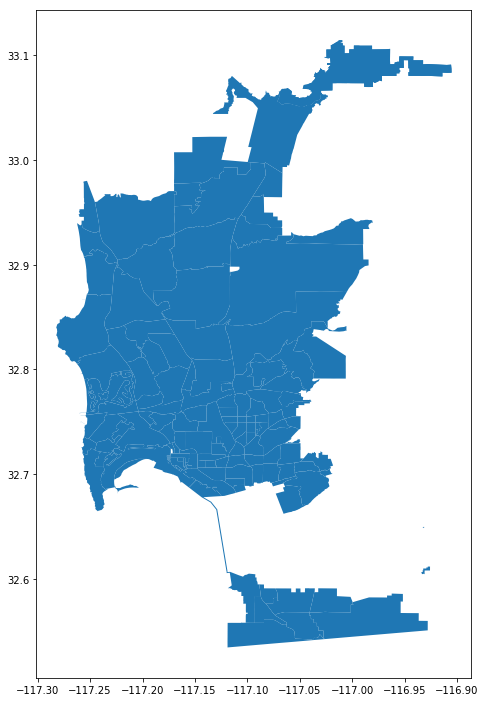

In [6]:
sd_pd_beats.set_index('beat', inplace=True)
sd_pd_beats = sd_pd_beats.cx[:-116.9, :]
bb = sd_pd_beats.total_bounds
aspect_ratio = (bb[3] - bb[1])/(bb[2] - bb[0])
x_dim = 8
sd_pd_beats.plot(figsize=(x_dim, x_dim*aspect_ratio))

## Visualize Beat Regions with Folium Map

In [7]:
import folium

In [8]:
beat_map_sd = folium.Map(location=[32.8, -117.10], zoom_start=13)

In [11]:
pd_beats = sd_pd_beats.reset_index()[['beat', 'serv']]

In [12]:
beat_map_sd.choropleth(geo_data=open('./pd_beats_datasd.geojson').read(), 
                       data=pd_beats,
                       columns=['beat', 'serv'],
                       key_on='feature.properties.beat',
                       fill_color='RdYlGn_r')

In [13]:
display(beat_map_sd)

In [14]:
beat_map_sd_uniq = folium.Map(location=[32.8, -117.10], zoom_start=13)


In [15]:
beat_map_sd_uniq.choropleth(geo_data=open('./pd_beats_datasd.geojson').read(), 
                            data=uniq,
                            columns=['beat', 'counts'],
                            key_on='feature.properties.beat',
                            fill_color='RdYlGn_r')

In [16]:
display(beat_map_sd_uniq)